In [1]:
# import all necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, BaggingClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
#from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold,train_test_split
from sklearn.metrics import auc,confusion_matrix, roc_curve, classification_report, accuracy_score
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import VGG16, ResNet50
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from PIL import Image, ImageTk
import warnings
warnings.filterwarnings('ignore')
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

## defining the paths

In [2]:
train_path = '/kaggle/input/cardamom/dataset_1/train'
valid_path = '/kaggle/input/cardamom/dataset_1/val'
test_path = '/kaggle/input/cardamom/dataset_1/test'

# importing the data using image generator 

In [3]:

train_datagen=ImageDataGenerator(rescale=1./255,validation_split=0.2)
test_datagen=ImageDataGenerator(rescale=1./255)


In [4]:
train=train_datagen.flow_from_directory(train_path,
                                        target_size=(224,224),
                                        color_mode='rgb',
                                        class_mode='categorical',
                                        batch_size=128,
                                        seed=32,
                                        subset='training',
                                        shuffle=True)



Found 1248 images belonging to 3 classes.


In [5]:
validation=train_datagen.flow_from_directory(train_path,
                                             target_size=(224,224),
                                             color_mode='rgb',
                                             class_mode='categorical',
                                             batch_size=128,
                                             seed=32,
                                             shuffle=False,
                                             subset='validation')

Found 311 images belonging to 3 classes.


In [6]:
test=test_datagen.flow_from_directory(test_path,
                                      target_size=(224,224)
                                      ,color_mode='rgb'
                                      ,class_mode='categorical',
                                      batch_size=128)

Found 174 images belonging to 3 classes.


# Displaying Class Labels
Here, we retrieve and display the class labels present in the dataset, providing a dictionary of class indices and a list of class names for reference.


In [7]:
# showing my calsses
classes_dict=train.class_indices
classes_dict

{'Blight1000': 0, 'Healthy_1000': 1, 'Phylosticta_LS_1000': 2}

In [8]:
classes=list(classes_dict.keys())
classes

['Blight1000', 'Healthy_1000', 'Phylosticta_LS_1000']

# Visualizing Training Set Samples

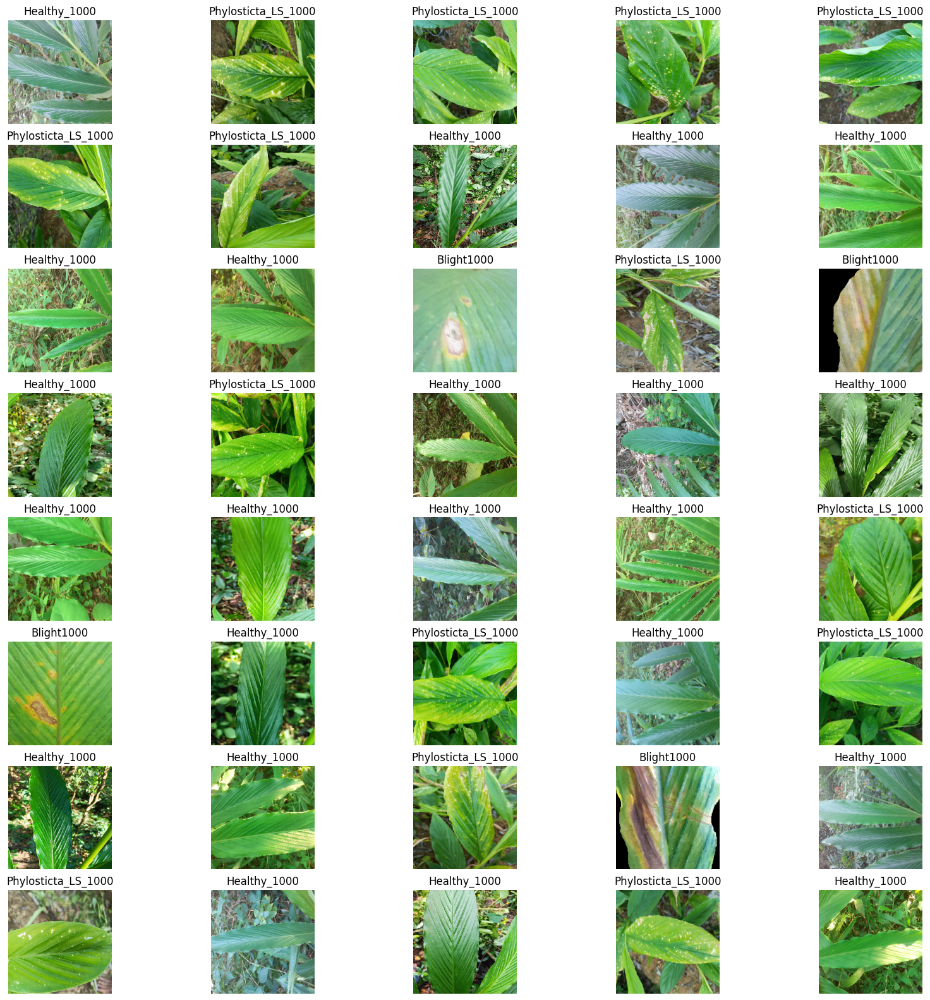

In [9]:

max_images = 40  
plt.figure(figsize=(20,20))
for X_batch, y_batch in train:
    for i in range(min(max_images, len(X_batch))):
        plt.subplot(8, 5, i + 1)  
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i] == 1)[0][0]])
        plt.axis('off')
    plt.show()
    break


# Visualizing Validation Set Samples

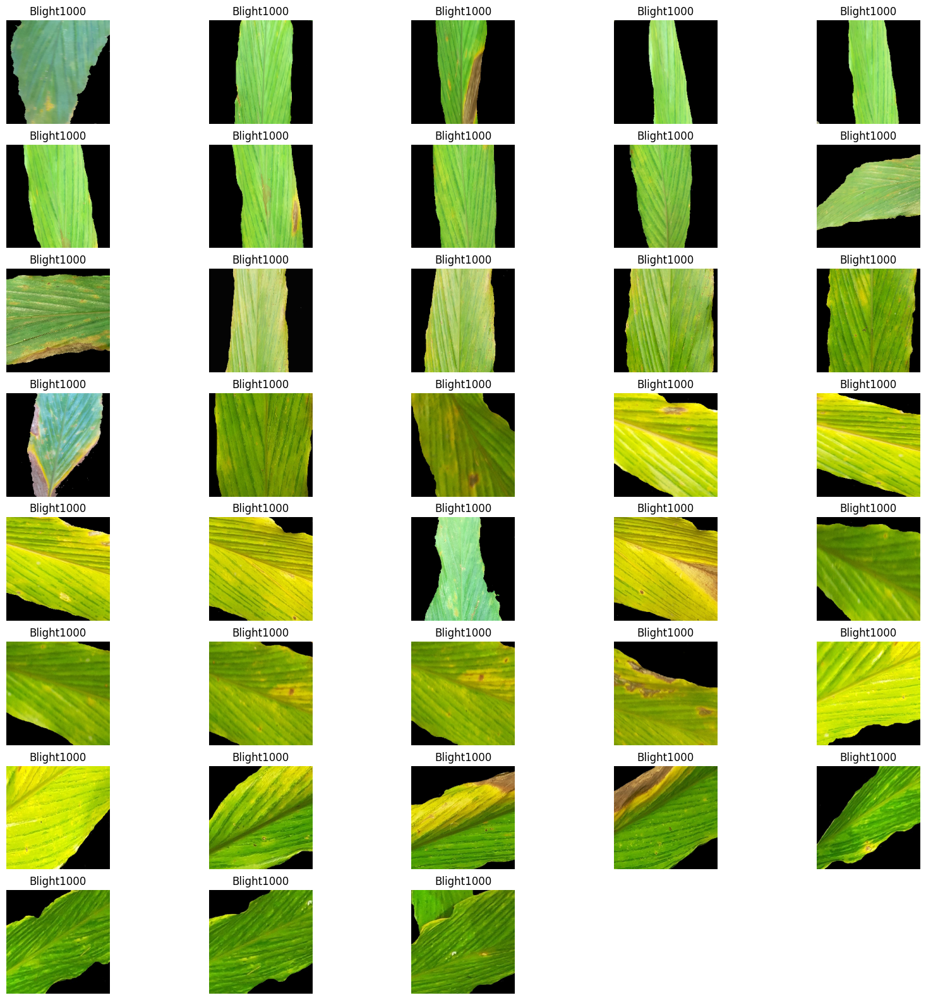

In [10]:

max_images = 38 
plt.figure(figsize=(20,20))
for X_batch, y_batch in validation:
    # Create a grid of images based on the maximum number
    for i in range(min(max_images, len(X_batch))):  #
        plt.subplot(8, 5, i + 1)  # Adjust the grid size as needed
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i] == 1)[0][0]])  # When y is categorical
        plt.axis('off')  # Turn off grid lines
    plt.show()  # Show the plot
    break  


# Resnet50 Model

## 1. Define ResNet50 base model

In [11]:
input_shape = (224, 224, 3)
input_layer=tf.keras.Input(input_shape)
resnet50_base_model=ResNet50(include_top=False,weights='imagenet',input_tensor=input_layer)
# Freeze the base model layers
#resnet50_base_model.trainable = False

resnet50_base_model.trainable = False

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


##  2. Build ResNet50 Model Architecture

In [12]:
resnet50_model = tf.keras.models.Sequential([
        resnet50_base_model,
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(38, activation='softmax')  # Adjust output units
    ])
resnet50_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)                │ (None, 7, 7, 2048)          │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 38)                  │          77,862 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,665,574 (90.28 MB)

 Trainable params: 77,862 (304.15 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [13]:
resnet50_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)                │ (None, 7, 7, 2048)          │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 38)                  │          77,862 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,665,574 (90.28 MB)

 Trainable params: 77,862 (304.15 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

## 3. Compile the model

In [14]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

resnet50_model.compile(loss="categorical_crossentropy", optimizer= optimizer, metrics=["accuracy",'precision','recall'])

## 4. Set callbacks

In [15]:
#callbacks
early_stopping=EarlyStopping(monitor='val_loss',patience=8,verbose=1, restore_best_weights=True)
checkpoints=ModelCheckpoint('resnet50.keras', monitor='val_loss', save_best_only=True,verbose=1)
reduceonplateau=ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=0.000001)
callback=[early_stopping,reduceonplateau,checkpoints]

## 5. Train ResNet50 model

In [16]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Input shape for images
input_shape = (224, 224, 3)

# Define input layer
input_layer = tf.keras.Input(shape=input_shape)

# Load ResNet50 base model
resnet50_base_model = ResNet50(include_top=False, weights='imagenet', input_tensor=input_layer)

# Freeze the base model layers
resnet50_base_model.trainable = False

# Build the sequential model
resnet50_model = tf.keras.models.Sequential([
    resnet50_base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(3, activation='softmax')  # Adjusted output units for 3 classes
])

# Model summary
resnet50_model.summary()

# Define optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

# Compile the model
resnet50_model.compile(
    loss="categorical_crossentropy", 
    optimizer=optimizer, 
    metrics=["accuracy", tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
)

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=8, verbose=1, restore_best_weights=True)
checkpoints = ModelCheckpoint('resnet50.keras', monitor='val_loss', save_best_only=True, verbose=1)
reduce_on_plateau = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=0.000001)

callbacks = [early_stopping, reduce_on_plateau, checkpoints]

# Train the model
resnet50_history = resnet50_model.fit(
    train,
    epochs=20,
    validation_data=validation,
    callbacks=callbacks,
    batch_size=64
)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)                │ (None, 7, 7, 2048)          │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 3)                   │           6,147 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,593,859 (90.00 MB)

 Trainable params: 6,147 (24.01 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

Epoch 1/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 804ms/step - accuracy: 0.3592 - loss: 1.2057 - precision: 0.3624 - recall: 0.1847
Epoch 1: val_loss improved from inf to 1.03042, saving model to resnet50.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.3620 - loss: 1.1996 - precision: 0.3650 - recall: 0.1891 - val_accuracy: 0.5113 - val_loss: 1.0304 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 0.0010
Epoch 2/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step - accuracy: 0.4407 - loss: 1.0960 - precision: 0.4450 - recall: 0.3604
Epoch 2: val_loss improved from 1.03042 to 0.99142, saving model to resnet50.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 624ms/step - accuracy: 0.4421 - loss: 1.0936 - precision: 0.4469 - recall: 0.3605 - val_accuracy: 0.4662 - val_loss: 0.9914 - val_precision: 0.4545 - val_recall: 0.0161 - learning_rate: 0.0010
Epoch 3/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step - accuracy: 0.4471 - loss: 1.0160 - precision: 0.4510 - recall: 0.2291
Epoch 3: val_los

### Setting Evaluation and plotting metrics functions

In [17]:
def evaluate_model (model,train_generator,test_generator):
    model_evaluate_train=model.evaluate(train_generator)
    print("Loss  ",model_evaluate_train[0])
    print("Accuracy  ",model_evaluate_train[1])
    print("precision  ",model_evaluate_train[2])
    print("Recall  ",model_evaluate_train[3])
    
    
    model_evaluate_test=model.evaluate(test_generator)
    print("Loss  ",model_evaluate_test[0])
    print("Accuracy  ",model_evaluate_test[1])
    print("precision  ",model_evaluate_test[2])
    print("Recall  ",model_evaluate_test[3])
    
    return np.round(model_evaluate_train[0],2),np.round(model_evaluate_test[0],2),np.round(model_evaluate_train[1],2),np.round(model_evaluate_test[1],2),np.round(model_evaluate_train[2],2),np.round(model_evaluate_test[2],2),np.round(model_evaluate_train[3],2),np.round(model_evaluate_test[3],2)

In [18]:
Final_Report=[]

In [19]:

def plot_training_history(history, metrics, title="Training and Validation Metrics"):
    # Set up the plot grid
    fig, axs = plt.subplots(2, 2, figsize=(14, 10))
    fig.suptitle(title, fontsize=16)

    
    for ax, metric in zip(axs.flat, metrics):
        ax.plot(history.history[metric], label=f'Training {metric.capitalize()}')
        ax.plot(history.history[f'val_{metric}'], label=f'Validation {metric.capitalize()}')
        ax.set_xlabel('Epochs')
        ax.set_ylabel(metric.capitalize())
        ax.set_title(f'Training and Validation {metric.capitalize()}')
        ax.legend()

   
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


metrics = ['accuracy', 'loss', 'recall', 'precision']



## 6. Evaluate the model

In [20]:
Final_Report.append(evaluate_model(resnet50_model,train,test))

10/10 ━━━━━━━━━━━━━━━━━━━━ 10s 958ms/step - accuracy: 0.6381 - loss: 0.7875 - precision: 0.7721 - recall: 0.3143
Loss   0.7852522730827332
Accuracy   0.6450320482254028
precision   0.7672584056854248
Recall   0.31169870495796204
2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 3s/step - accuracy: 0.5322 - loss: 0.8416 - precision: 0.6593 - recall: 0.2674 
Loss   0.8443642258644104
Accuracy   0.5287356376647949
precision   0.6388888955116272
Recall   0.26436781883239746


## 7.  Plotting Training and Validation Metrics

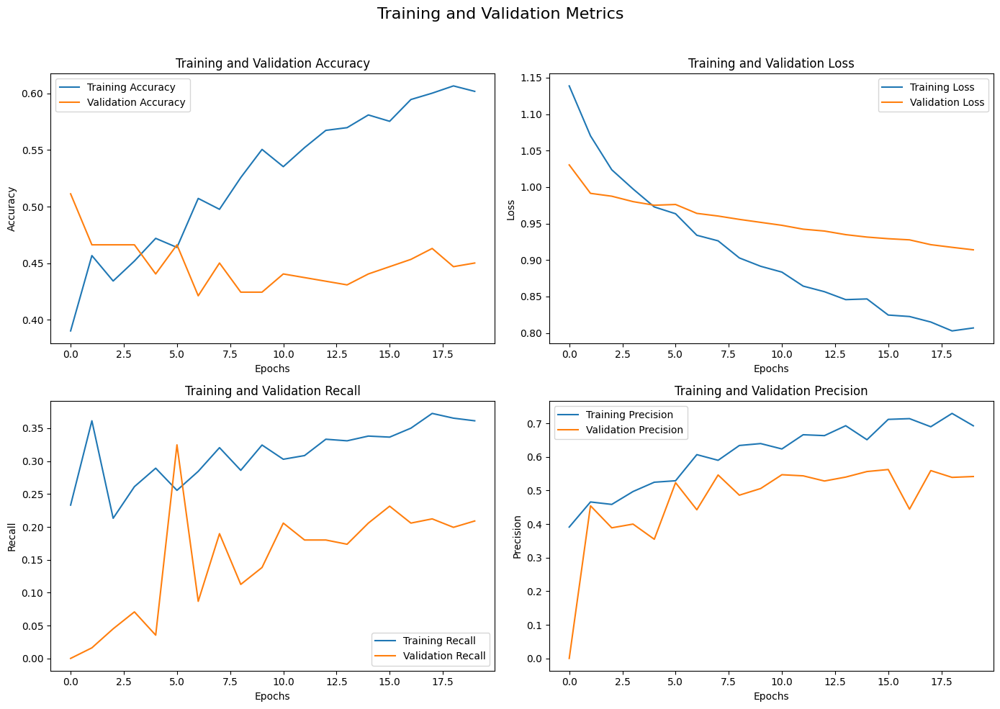

In [21]:
plot_training_history(resnet50_history, metrics)

# Now VGG16

## 1. Define the base model

In [22]:
vgg16_base_model=VGG16(include_top=False,weights='imagenet',input_shape=(224,224,3))

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [23]:
vgg16_base_model.trainable = False

## 2. Build VGG16 Model Architechture

In [24]:
#Transfer Learning Model
inputs=tf.keras.Input(shape=(224,224,3))
x=vgg16_base_model(inputs)
x=tf.keras.layers.GlobalAveragePooling2D()(x)
x= tf.keras.layers.BatchNormalization()(x)
x= tf.keras.layers.Dropout(0.2)(x)
outputs=tf.keras.layers.Dense(38, activation="softmax")(x)
vgg16_model = tf.keras.Model(inputs=inputs, outputs=outputs)
vgg16_model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ vgg16 (Functional)                   │ (None, 7, 7, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_2           │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 38)                  │          19,494 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,736,230 (56.21 MB)

 Trainable params: 20,518 (80.15 KB)

 Non-trainable params: 14,715,712 (56.14 MB)

## 3. Compile The Model

In [25]:
vgg16_model.compile(loss="categorical_crossentropy", optimizer= 'adam', metrics=["accuracy",'precision','recall'])

## 4. Set Callbacks

In [26]:
early_stopping_vgg=EarlyStopping(monitor='val_loss',patience=8,verbose=2, restore_best_weights=True)
checkpoints_vgg=ModelCheckpoint('vgg16.keras', monitor='val_loss', save_best_only=True,verbose=2)
reduceonplateau_vgg=ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=0.000001)
callback_vgg=[early_stopping_vgg,reduceonplateau_vgg,checkpoints_vgg]

## 5. Train VGG16 Model

In [27]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Load VGG16 base model
vgg16_base_model = VGG16(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
vgg16_base_model.trainable = False

# Define model structure
inputs = tf.keras.Input(shape=(224, 224, 3))
x = vgg16_base_model(inputs)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = tf.keras.layers.Dense(3, activation="softmax")(x)  # Adjusted to 3 classes
vgg16_model = tf.keras.Model(inputs=inputs, outputs=outputs)

# Model summary
vgg16_model.summary()

# Compile the model
vgg16_model.compile(
    loss="categorical_crossentropy", 
    optimizer='adam', 
    metrics=["accuracy", tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
)

# Callbacks
early_stopping_vgg = EarlyStopping(monitor='val_loss', patience=8, verbose=2, restore_best_weights=True)
checkpoints_vgg = ModelCheckpoint('vgg16.keras', monitor='val_loss', save_best_only=True, verbose=2)
reduce_on_plateau_vgg = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=0.000001)
callback_vgg = [early_stopping_vgg, reduce_on_plateau_vgg, checkpoints_vgg]

# Train the model
vgg16_history = vgg16_model.fit(
    train,
    epochs=35,
    validation_data=validation,
    callbacks=callback_vgg
)


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ vgg16 (Functional)                   │ (None, 7, 7, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_3           │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 3)                   │           1,539 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,718,275 (56.15 MB)

 Trainable params: 2,563 (10.01 KB)

 Non-trainable params: 14,715,712 (56.14 MB)

Epoch 1/35
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.5666 - loss: 0.9139 - precision_1: 0.6047 - recall_1: 0.4833
Epoch 1: val_loss improved from inf to 1.02591, saving model to vgg16.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 72s 4s/step - accuracy: 0.5741 - loss: 0.9012 - precision_1: 0.6131 - recall_1: 0.4913 - val_accuracy: 0.3891 - val_loss: 1.0259 - val_precision_1: 0.3903 - val_recall_1: 0.3891 - learning_rate: 0.0010
Epoch 2/35
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step - accuracy: 0.8412 - loss: 0.4405 - precision_1: 0.8658 - recall_1: 0.7900
Epoch 2: val_loss improved from 1.02591 to 0.94964, saving model to vgg16.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 646ms/step - accuracy: 0.8442 - loss: 0.4349 - precision_1: 0.8688 - recall_1: 0.7943 - val_accuracy: 0.3891 - val_loss: 0.9496 - val_precision_1: 0.3903 - val_recall_1: 0.3891 - learning_rate: 0.0010
Epoch 3/35
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step - accuracy: 0.9302 - loss: 0.2280 - precision_1: 0.9417 - recall_1: 0.9134
Epoch

## 6. Evaluate the model

In [28]:
Final_Report.append(evaluate_model(vgg16_model,train,test))

10/10 ━━━━━━━━━━━━━━━━━━━━ 9s 897ms/step - accuracy: 0.9931 - loss: 0.0598 - precision_1: 0.9943 - recall_1: 0.9931
Loss   0.05987973138689995
Accuracy   0.9927884340286255
precision   0.9943820238113403
Recall   0.9927884340286255
2/2 ━━━━━━━━━━━━━━━━━━━━ 10s 9s/step - accuracy: 0.9704 - loss: 0.1114 - precision_1: 0.9704 - recall_1: 0.9704
Loss   0.11114422976970673
Accuracy   0.9712643623352051
precision   0.9712643623352051
Recall   0.9712643623352051


## 7. Plotting Training and Validation Metrics

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ vgg16 (Functional)                   │ (None, 7, 7, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_4           │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 3)                   │           1,539 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,718,275 (56.15 MB)

 Trainable params: 2,563 (10.01 KB)

 Non-trainable params: 14,715,712 (56.14 MB)

Epoch 1/35
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step - accuracy: 0.3781 - loss: 1.4216 - precision: 0.3818 - recall: 0.2949
Epoch 1: val_loss improved from inf to 0.90343, saving model to vgg16.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 18s 942ms/step - accuracy: 0.3849 - loss: 1.4018 - precision: 0.3903 - recall: 0.3016 - val_accuracy: 0.4887 - val_loss: 0.9034 - val_precision: 0.7460 - val_recall: 0.3023 - learning_rate: 0.0010
Epoch 2/35
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step - accuracy: 0.7378 - loss: 0.6029 - precision: 0.7828 - recall: 0.6750
Epoch 2: val_loss improved from 0.90343 to 0.82465, saving model to vgg16.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 630ms/step - accuracy: 0.7412 - loss: 0.5975 - precision: 0.7859 - recall: 0.6787 - val_accuracy: 0.6720 - val_loss: 0.8246 - val_precision: 0.8770 - val_recall: 0.5273 - learning_rate: 0.0010
Epoch 3/35
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step - accuracy: 0.8760 - loss: 0.3460 - precision: 0.8965 - recall: 0.8403
Epoch 3: val_loss improved 

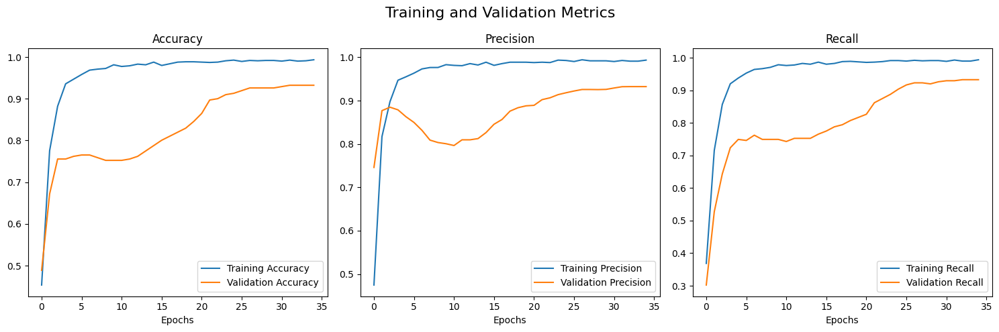

In [29]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import matplotlib.pyplot as plt

# Load VGG16 base model
vgg16_base_model = VGG16(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
vgg16_base_model.trainable = False

# Define model structure
inputs = tf.keras.Input(shape=(224, 224, 3))
x = vgg16_base_model(inputs)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = tf.keras.layers.Dense(3, activation="softmax")(x)  # Adjusted for 3 classes
vgg16_model = tf.keras.Model(inputs=inputs, outputs=outputs)

# Model summary
vgg16_model.summary()

# Compile the model with TensorFlow metric objects
vgg16_model.compile(
    loss="categorical_crossentropy", 
    optimizer='adam', 
    metrics=["accuracy", tf.keras.metrics.Precision(name='precision'), tf.keras.metrics.Recall(name='recall')]
)

# Define callbacks
early_stopping_vgg = EarlyStopping(monitor='val_loss', patience=8, verbose=2, restore_best_weights=True)
checkpoints_vgg = ModelCheckpoint('vgg16.keras', monitor='val_loss', save_best_only=True, verbose=2)
reduce_on_plateau_vgg = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=0.000001)
callback_vgg = [early_stopping_vgg, reduce_on_plateau_vgg, checkpoints_vgg]

# Train the model
vgg16_history = vgg16_model.fit(
    train,
    epochs=35,
    validation_data=validation,
    callbacks=callback_vgg,
    batch_size=64  # Specify batch size if necessary
)

# Function to plot training history
def plot_training_history(history, metrics, title="Training and Validation Metrics"):
    fig, axs = plt.subplots(1, len(metrics), figsize=(15, 5))
    fig.suptitle(title, fontsize=16)

    for ax, metric in zip(axs.flat, metrics):
        if metric in history.history:  # Check if metric exists in history
            ax.plot(history.history[metric], label=f'Training {metric.capitalize()}')
            ax.plot(history.history[f'val_{metric}'], label=f'Validation {metric.capitalize()}')
            ax.set_xlabel('Epochs')
            ax.set_title(metric.capitalize())
            ax.legend()
        else:
            print(f"Metric '{metric}' not found in history.")
    plt.tight_layout()
    plt.show()

# Define the metrics to plot
metrics_to_plot = ['accuracy', 'precision', 'recall']

# Plot training history
plot_training_history(vgg16_history, metrics_to_plot)


In [30]:
Final_Report

[(0.79, 0.84, 0.65, 0.53, 0.77, 0.64, 0.31, 0.26),
 (0.06, 0.11, 0.99, 0.97, 0.99, 0.97, 0.99, 0.97)]

In [31]:
models_name=['ResNet50','VGG16']
Model_accuracy=pd.DataFrame(Final_Report,index=models_name,columns=['Train Loss','Test Loss','Train Accuracy','Test Accuracy','Train precision','Test precision','Train Recall','Test Recall'])


In [32]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16, ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Input, Dense, Flatten, Concatenate, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Image input size
IMG_SIZE = (224, 224, 3)

# Define a single shared input layer
input_layer = Input(shape=IMG_SIZE, name="shared_input")

# Load pre-trained models with shared input
vgg16_base = VGG16(weights="imagenet", include_top=False, input_tensor=input_layer)
resnet50_base = ResNet50(weights="imagenet", include_top=False, input_tensor=input_layer)

# Freeze pre-trained layers
for model in [vgg16_base, resnet50_base]:
    for layer in model.layers:
        layer.trainable = False  # Freeze pre-trained weights

# Extract feature maps using Global Average Pooling (reduces parameters)
vgg16_features = GlobalAveragePooling2D(name="vgg16_pool")(vgg16_base.output)
resnet50_features = GlobalAveragePooling2D(name="resnet50_pool")(resnet50_base.output)

# Merge feature vectors
merged = Concatenate(name="merged_features")([vgg16_features, resnet50_features])

# Fully connected layers
fc = Dense(512, activation="relu", name="fc1")(merged)
fc = Dropout(0.5, name="dropout1")(fc)
fc = Dense(256, activation="relu", name="fc2")(fc)
fc = Dropout(0.5, name="dropout2")(fc)
output = Dense(3, activation="softmax", name="output_layer")(fc)  # Adjust for 3 classes

# Define the merged model
merged_model = Model(inputs=input_layer, outputs=output)

# Compile the model
merged_model.compile(optimizer=Adam(learning_rate=0.0001), loss="categorical_crossentropy", metrics=["accuracy"])

# Summary
merged_model.summary()

# ---------------------- DATA LOADING ---------------------- #
train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=30, horizontal_flip=True, validation_split=0.2)

# Load dataset from directory (modify path accordingly)
train_generator = train_datagen.flow_from_directory(
    "/kaggle/input/cardamom/dataset_1/train",  # Change to your dataset path
    target_size=(224, 224),
    batch_size=32,
    class_mode="categorical",
    subset="training"
)

val_generator = train_datagen.flow_from_directory(
    "/kaggle/input/cardamom/dataset_1/val",
    target_size=(224, 224),
    batch_size=32,
    class_mode="categorical",
    subset="validation"
)

# ---------------------- TRAIN MODEL FOR 30 EPOCHS ---------------------- #
history = merged_model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=35
)


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ shared_input (InputLayer) │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ shared_input[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 39,745,731 (151.62 MB)

 Trainable params: 1,443,331 (5.51 MB)

 Non-trainable params: 38,302,400 (146.11 MB)

Found 1248 images belonging to 3 classes.
Found 83 images belonging to 3 classes.
Epoch 1/35
39/39 ━━━━━━━━━━━━━━━━━━━━ 49s 714ms/step - accuracy: 0.4124 - loss: 1.2552 - val_accuracy: 0.6867 - val_loss: 0.8810
Epoch 2/35
39/39 ━━━━━━━━━━━━━━━━━━━━ 20s 429ms/step - accuracy: 0.4603 - loss: 1.0242 - val_accuracy: 0.6145 - val_loss: 0.8167
Epoch 3/35
39/39 ━━━━━━━━━━━━━━━━━━━━ 21s 448ms/step - accuracy: 0.5905 - loss: 0.8653 - val_accuracy: 0.8795 - val_loss: 0.6853
Epoch 4/35
39/39 ━━━━━━━━━━━━━━━━━━━━ 20s 433ms/step - accuracy: 0.6876 - loss: 0.7369 - val_accuracy: 0.8916 - val_loss: 0.5241
Epoch 5/35
39/39 ━━━━━━━━━━━━━━━━━━━━ 20s 422ms/step - accuracy: 0.7665 - loss: 0.6049 - val_accuracy: 0.8795 - val_loss: 0.4290
Epoch 6/35
39/39 ━━━━━━━━━━━━━━━━━━━━ 20s 431ms/step - accuracy: 0.8508 - loss: 0.4431 - val_accuracy: 0.9157 - val_loss: 0.3592
Epoch 7/35
39/39 ━━━━━━━━━━━━━━━━━━━━ 20s 434ms/step - accuracy: 0.8938 - loss: 0.3683 - val_accuracy: 0.9036 - val_loss: 0.3255
Epoch 8/35
39/3

In [33]:
test_datagen = ImageDataGenerator(rescale=1.0/255)

test_generator = test_datagen.flow_from_directory(
    "/kaggle/input/cardamom/dataset_1/test",  # Update with your test data path
    target_size=(224, 224),
    batch_size=32,
    class_mode="categorical",
    shuffle=False
)

# Evaluate model on test data
test_loss, test_accuracy = merged_model.evaluate(test_generator)

print(f"✅ Test Accuracy: {test_accuracy * 100:.2f}%")

Found 174 images belonging to 3 classes.
6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.9677 - loss: 0.0693  
✅ Test Accuracy: 94.25%


# The Final one is DenseNet121

## 1. Define the base model and Build model architecture

In [34]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam


densenet_base_model = DenseNet121(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
densenet_base_model.trainable = False  

# Build model architecture
inputs = layers.Input(shape=(224, 224, 3))
x = densenet_base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.5)(x)  
outputs = layers.Dense(38, activation='softmax')(x)  


densenet_model = models.Model(inputs, outputs)

# Compile the model
densenet_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)

# Summary to check layer details
densenet_model.summary()


29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ densenet121 (Functional)             │ (None, 7, 7, 1024)          │       7,037,504 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_5           │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 38)                  │          38,950 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,076,454 (26.99 MB)

 Trainable params: 38,950 (152.15 KB)

 Non-trainable params: 7,037,504 (26.85 MB)

## 2. Compile the model

In [35]:
# Unfreeze last layers for fine-tuning
densenet_base_model.trainable = True
for layer in densenet_base_model.layers[:-20]:  
    layer.trainable = False

# Recompile before fine-tuning
densenet_model.compile(
    optimizer=Adam(learning_rate=0.001),  
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)


## 3. Set callbacks and Train The Model

Found 1559 images belonging to 3 classes.
Found 422 images belonging to 3 classes.


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_13 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ densenet121 (Functional)             │ (None, 7, 7, 1024)          │       7,037,504 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_6           │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 1024)                │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 3)                   │           3,075 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,044,675 (26.87 MB)

 Trainable params: 5,123 (20.01 KB)

 Non-trainable params: 7,039,552 (26.85 MB)

Epoch 1/35
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4907 - loss: 1.1650 - precision: 0.5202 - recall: 0.4183
Epoch 1: val_loss improved from inf to 0.48413, saving model to densenet121.keras
25/25 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.4978 - loss: 1.1497 - precision: 0.5280 - recall: 0.4262 - val_accuracy: 0.7915 - val_loss: 0.4841 - val_precision: 0.8141 - val_recall: 0.7678 - learning_rate: 0.0010
Epoch 2/35
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 676ms/step - accuracy: 0.9410 - loss: 0.1971 - precision: 0.9551 - recall: 0.9333
Epoch 2: val_loss improved from 0.48413 to 0.36439, saving model to densenet121.keras
25/25 ━━━━━━━━━━━━━━━━━━━━ 27s 829ms/step - accuracy: 0.9413 - loss: 0.1960 - precision: 0.9553 - recall: 0.9337 - val_accuracy: 0.8294 - val_loss: 0.3644 - val_precision: 0.8452 - val_recall: 0.8152 - learning_rate: 0.0010
Epoch 3/35
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 713ms/step - accuracy: 0.9774 - loss: 0.1078 - precision: 0.9807 - recall: 0.9715
Epoch 3: val_loss imp

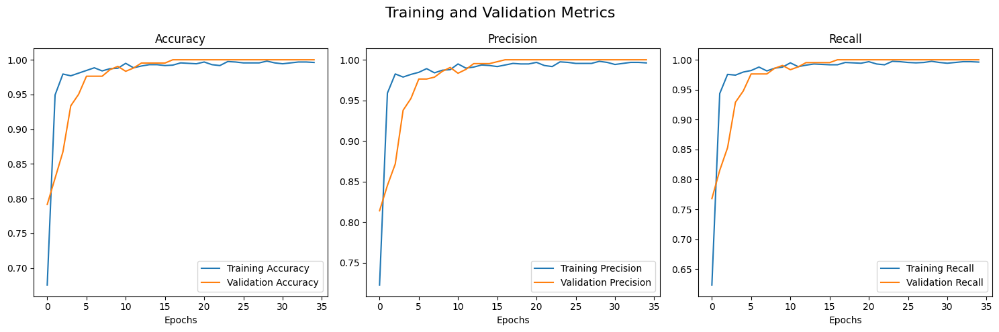

In [36]:


import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import matplotlib.pyplot as plt

# Define dataset directories (update these paths based on your dataset location)
train_dir = '/kaggle/input/cardamom/dataset_1/train'  # Update with your train dataset path
validation_dir = '/kaggle/input/cardamom/dataset_1/val'  # Update with your validation dataset path

# Load datasets using ImageDataGenerator
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

validation_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

train = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical'
)

validation = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical'
)

# Load DenseNet121 base model
densenet_base_model = DenseNet121(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
densenet_base_model.trainable = False

# Define model structure
inputs = tf.keras.Input(shape=(224, 224, 3))
x = densenet_base_model(inputs)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = tf.keras.layers.Dense(3, activation="softmax")(x)  # Adjusted for 3 classes
densenet_model = tf.keras.Model(inputs=inputs, outputs=outputs)

# Model summary
densenet_model.summary()

# Compile the model with TensorFlow metric objects
densenet_model.compile(
    loss="categorical_crossentropy", 
    optimizer='adam', 
    metrics=["accuracy", tf.keras.metrics.Precision(name='precision'), tf.keras.metrics.Recall(name='recall')]
)

# Define callbacks
early_stopping_densenet = EarlyStopping(monitor='val_loss', patience=8, verbose=2, restore_best_weights=True)
checkpoints_densenet = ModelCheckpoint('densenet121.keras', monitor='val_loss', save_best_only=True, verbose=2)
reduce_on_plateau_densenet = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=0.000001)
callback_densenet = [early_stopping_densenet, reduce_on_plateau_densenet, checkpoints_densenet]

# Train the model
densenet_history = densenet_model.fit(
    train,
    epochs=35,
    validation_data=validation,
    callbacks=callback_densenet
)

# Function to plot training history
def plot_training_history(history, metrics, title="Training and Validation Metrics"):
    fig, axs = plt.subplots(1, len(metrics), figsize=(15, 5))
    fig.suptitle(title, fontsize=16)

    for ax, metric in zip(axs.flat, metrics):
        if metric in history.history:  # Check if metric exists in history
            ax.plot(history.history[metric], label=f'Training {metric.capitalize()}')
            ax.plot(history.history[f'val_{metric}'], label=f'Validation {metric.capitalize()}')
            ax.set_xlabel('Epochs')
            ax.set_title(metric.capitalize())
            ax.legend()
        else:
            print(f"Metric '{metric}' not found in history.")
    plt.tight_layout()
    plt.show()

# Define the metrics to plot
metrics_to_plot = ['accuracy', 'precision', 'recall']

# Plot training history
plot_training_history(densenet_history, metrics_to_plot)


In [37]:
test_path = '/kaggle/input/cardamom/dataset_1/test'
test=test_datagen.flow_from_directory(test_path,
                                      target_size=(224,224)
                                      ,color_mode='rgb'
                                      ,class_mode='categorical',
                                      batch_size=128)
Final_Report.append(evaluate_model(densenet_model,train,test))

Found 174 images belonging to 3 classes.
25/25 ━━━━━━━━━━━━━━━━━━━━ 29s 1s/step - accuracy: 0.9992 - loss: 0.0063 - precision: 0.9992 - recall: 0.9992
Loss   0.006521833129227161
Accuracy   0.9987171292304993
precision   0.9987171292304993
Recall   0.9987171292304993
2/2 ━━━━━━━━━━━━━━━━━━━━ 24s 10s/step - accuracy: 1.0000 - loss: 0.0057 - precision: 1.0000 - recall: 1.0000
Loss   0.005725394003093243
Accuracy   1.0
precision   1.0
Recall   1.0


## 4. Plot Training and Validation Metrics

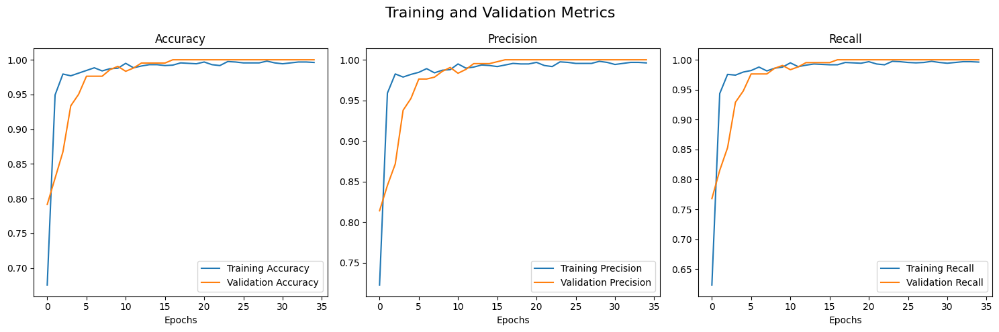

In [38]:
# Define the metrics to plot
metrics_to_plot = ['accuracy', 'precision', 'recall']

# Call the plot_training_history function with the correct variables
plot_training_history(densenet_history, metrics_to_plot)

In [39]:
Final_Report

[(0.79, 0.84, 0.65, 0.53, 0.77, 0.64, 0.31, 0.26),
 (0.06, 0.11, 0.99, 0.97, 0.99, 0.97, 0.99, 0.97),
 (0.01, 0.01, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0)]

In [40]:
models_name.append('DenseNet121')
Model_accuracy=pd.DataFrame(Final_Report,index=models_name,columns=['Train Loss','Test Loss','Train Accuracy','Test Accuracy','Train precision','Test precision','Train Recall','Test Recall'])


In [41]:
Model_accuracy.to_csv('Report.csv',index=False)

# Model Evaluation Summary For 3 Transfer Learning Models

###### Model_accuracy

**TOMATO_DISEASE_DETECTION**

In [57]:
import os
import shutil
import random

# Define dataset paths
dataset_path = "/kaggle/input/tomatoleaf/tomato"  # Change this if needed
val_path = os.path.join(dataset_path, "val")  # Validation dataset path
test_path = "/kaggle/working/test"  # New test dataset path

# Create test directory
os.makedirs(test_path, exist_ok=True)

# Test dataset split percentage
test_split = 0.2  # 20% of validation data

# Copy images from validation set to test set
for class_name in os.listdir(val_path):
    class_val_path = os.path.join(val_path, class_name)
    class_test_path = os.path.join(test_path, class_name)
    
    # Create class folder in test set
    os.makedirs(class_test_path, exist_ok=True)
    
    # List images and shuffle
    images = os.listdir(class_val_path)
    random.shuffle(images)
    
    # Select 20% images for test set
    num_test_images = int(len(images) * test_split)
    
    # Copy selected images to test set
    for img in images[:num_test_images]:
        src = os.path.join(class_val_path, img)
        dst = os.path.join(class_test_path, img)
        shutil.copy(src, dst)  # Use copy instead of move

print("✅ Test dataset created successfully!")


✅ Test dataset created successfully!


In [58]:
from PIL import Image
import os

# Define your dataset path (Modify if needed)
dataset_path = "/kaggle/input/tomatoleaf/tomato/train"

# Get a random image file
random_class = os.listdir(dataset_path)[0]  # Pick first class folder
random_image = os.listdir(os.path.join(dataset_path, random_class))[0]  # Pick first image
image_path = os.path.join(dataset_path, random_class, random_image)

# Open and check size
image = Image.open(image_path)
print(f"Image Size: {image.size}")  # Output format: (width, height)

Image Size: (256, 256)


In [60]:
# import all necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, BaggingClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
#from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold,train_test_split
from sklearn.metrics import auc,confusion_matrix, roc_curve, classification_report, accuracy_score
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import VGG16, ResNet50
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from PIL import Image, ImageTk
import warnings
warnings.filterwarnings('ignore')
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [61]:
train_path = '/kaggle/input/tomatoleaf/tomato/train'
valid_path = '/kaggle/input/tomatoleaf/tomato/val'
test_path = '/kaggle/working/test'

In [63]:
train_datagen=ImageDataGenerator(rescale=1./255,validation_split=0.2)
test_datagen=ImageDataGenerator(rescale=1./255)

In [64]:
train=train_datagen.flow_from_directory(train_path,
                                        target_size=(224,224),
                                        color_mode='rgb',
                                        class_mode='categorical',
                                        batch_size=128,
                                        seed=32,
                                        subset='training',
                                        shuffle=True)

Found 8000 images belonging to 10 classes.


In [65]:
validation=train_datagen.flow_from_directory(train_path,
                                             target_size=(224,224),
                                             color_mode='rgb',
                                             class_mode='categorical',
                                             batch_size=128,
                                             seed=32,
                                             shuffle=False,
                                             subset='validation')

Found 2000 images belonging to 10 classes.


In [66]:
test=test_datagen.flow_from_directory(test_path,
                                      target_size=(224,224)
                                      ,color_mode='rgb'
                                      ,class_mode='categorical',
                                      batch_size=128)

Found 200 images belonging to 10 classes.


In [67]:
# showing my calsses
classes_dict=train.class_indices
classes_dict

{'Tomato___Bacterial_spot': 0,
 'Tomato___Early_blight': 1,
 'Tomato___Late_blight': 2,
 'Tomato___Leaf_Mold': 3,
 'Tomato___Septoria_leaf_spot': 4,
 'Tomato___Spider_mites Two-spotted_spider_mite': 5,
 'Tomato___Target_Spot': 6,
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus': 7,
 'Tomato___Tomato_mosaic_virus': 8,
 'Tomato___healthy': 9}

In [68]:
classes=list(classes_dict.keys())
classes

['Tomato___Bacterial_spot',
 'Tomato___Early_blight',
 'Tomato___Late_blight',
 'Tomato___Leaf_Mold',
 'Tomato___Septoria_leaf_spot',
 'Tomato___Spider_mites Two-spotted_spider_mite',
 'Tomato___Target_Spot',
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
 'Tomato___Tomato_mosaic_virus',
 'Tomato___healthy']

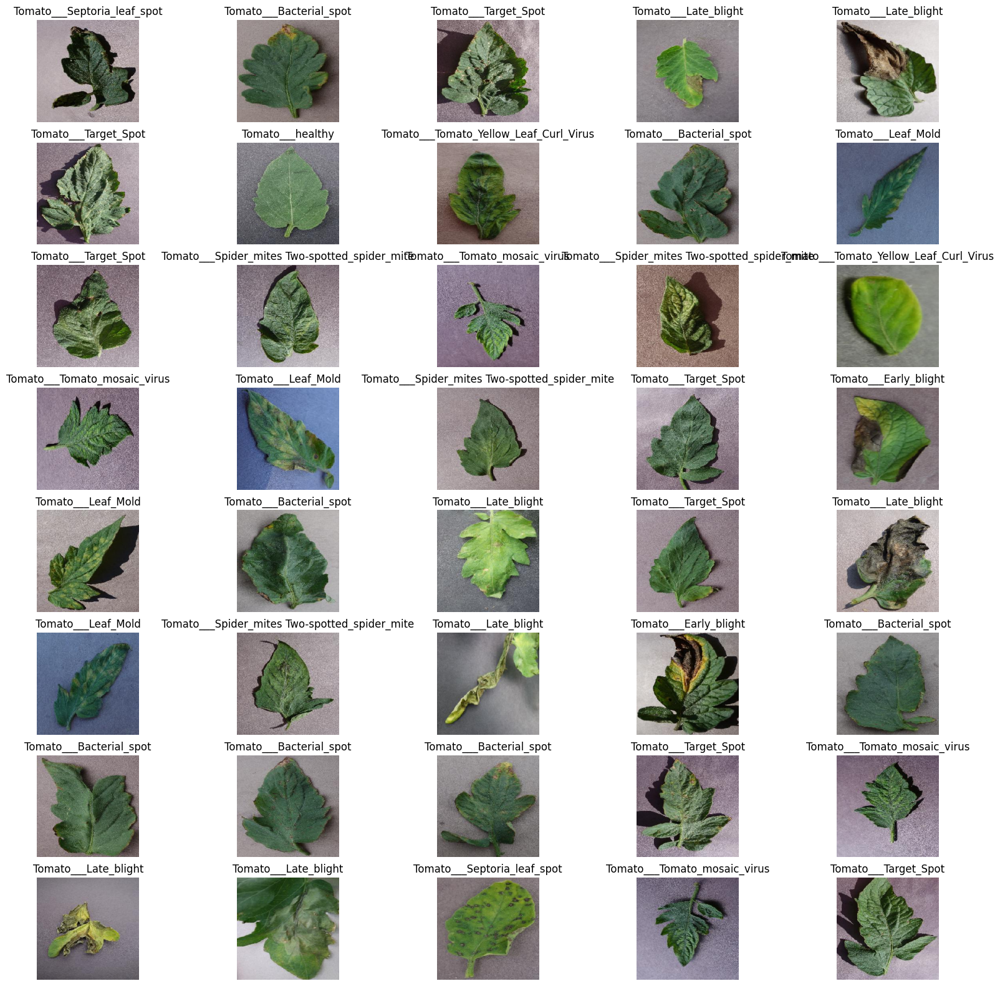

In [69]:
max_images = 40  
plt.figure(figsize=(20,20))
for X_batch, y_batch in train:
    for i in range(min(max_images, len(X_batch))):
        plt.subplot(8, 5, i + 1)  
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i] == 1)[0][0]])
        plt.axis('off')
    plt.show()
    break

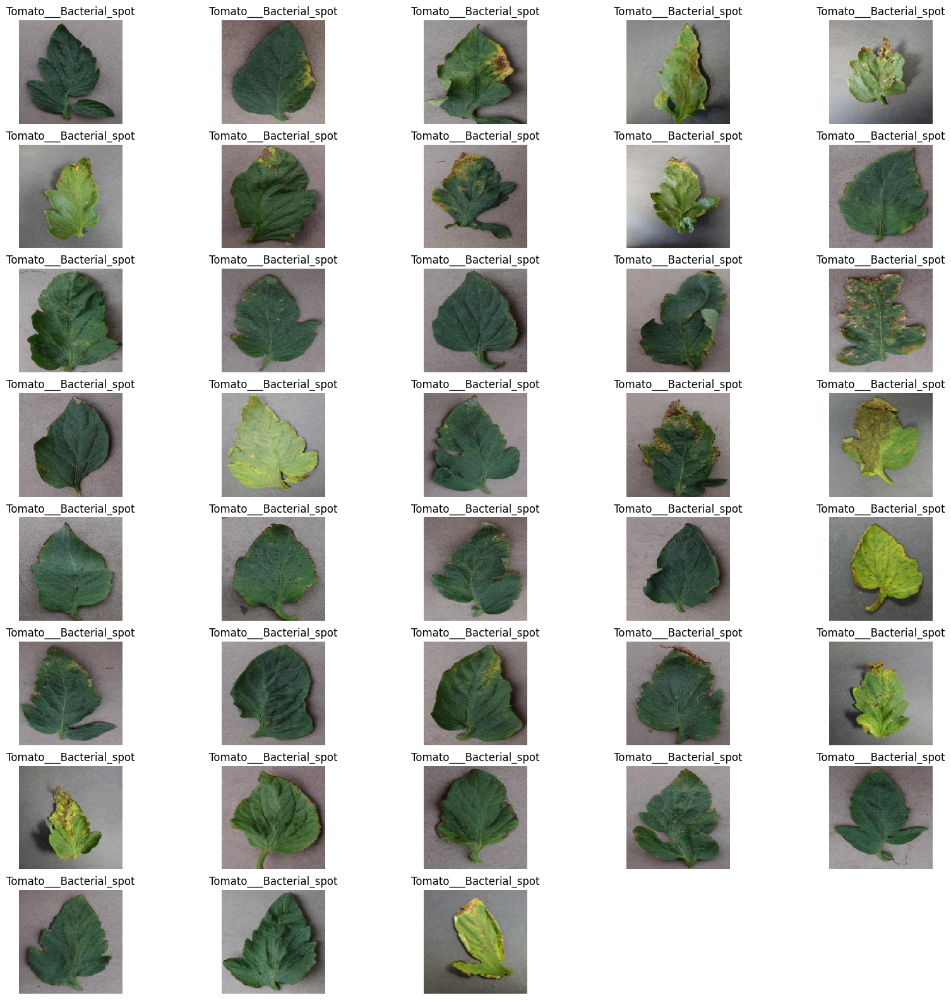

In [70]:
max_images = 38 
plt.figure(figsize=(20,20))
for X_batch, y_batch in validation:
    # Create a grid of images based on the maximum number
    for i in range(min(max_images, len(X_batch))):  #
        plt.subplot(8, 5, i + 1)  # Adjust the grid size as needed
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i] == 1)[0][0]])  # When y is categorical
        plt.axis('off')  # Turn off grid lines
    plt.show()  # Show the plot
    break 

In [71]:
input_shape = (224, 224, 3)
input_layer=tf.keras.Input(input_shape)
resnet50_base_model=ResNet50(include_top=False,weights='imagenet',input_tensor=input_layer)
# Freeze the base model layers
#resnet50_base_model.trainable = False

resnet50_base_model.trainable = False

In [72]:
resnet50_model = tf.keras.models.Sequential([
        resnet50_base_model,
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(38, activation='softmax')  # Adjust output units
    ])
resnet50_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)                │ (None, 7, 7, 2048)          │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_7           │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 38)                  │          77,862 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,665,574 (90.28 MB)

 Trainable params: 77,862 (304.15 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [73]:
resnet50_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)                │ (None, 7, 7, 2048)          │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_7           │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 38)                  │          77,862 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,665,574 (90.28 MB)

 Trainable params: 77,862 (304.15 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [74]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

resnet50_model.compile(loss="categorical_crossentropy", optimizer= optimizer, metrics=["accuracy",'precision','recall'])

In [75]:
#callbacks
early_stopping=EarlyStopping(monitor='val_loss',patience=8,verbose=1, restore_best_weights=True)
checkpoints=ModelCheckpoint('resnet50.keras', monitor='val_loss', save_best_only=True,verbose=1)
reduceonplateau=ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=0.000001)
callback=[early_stopping,reduceonplateau,checkpoints]

In [76]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Input shape for images
input_shape = (224, 224, 3)

# Define input layer
input_layer = tf.keras.Input(shape=input_shape)

# Load ResNet50 base model
resnet50_base_model = ResNet50(include_top=False, weights='imagenet', input_tensor=input_layer)

# Freeze the base model layers
resnet50_base_model.trainable = False

# Build the sequential model
resnet50_model = tf.keras.models.Sequential([
    resnet50_base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(0.2),
   tf.keras.layers.Dense(10, activation='softmax')  # Adjusted output units for 3 classes
])

# Model summary
resnet50_model.summary()

# Define optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

# Compile the model
resnet50_model.compile(
    loss="categorical_crossentropy", 
    optimizer=optimizer, 
    metrics=["accuracy", tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
)

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=8, verbose=1, restore_best_weights=True)
checkpoints = ModelCheckpoint('resnet50.keras', monitor='val_loss', save_best_only=True, verbose=1)
reduce_on_plateau = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=0.000001)

callbacks = [early_stopping, reduce_on_plateau, checkpoints]

# Train the model
resnet50_history = resnet50_model.fit(
    train,
    epochs=20,
    validation_data=validation,
    callbacks=callbacks,
    batch_size=64
)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)                │ (None, 7, 7, 2048)          │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_8           │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 10)                  │          20,490 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,608,202 (90.06 MB)

 Trainable params: 20,490 (80.04 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

Epoch 1/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 730ms/step - accuracy: 0.1017 - loss: 2.4215 - precision_2: 0.0000e+00 - recall_2: 0.0000e+00
Epoch 1: val_loss improved from inf to 2.24000, saving model to resnet50.keras
63/63 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - accuracy: 0.1019 - loss: 2.4205 - precision_2: 0.0000e+00 - recall_2: 0.0000e+00 - val_accuracy: 0.2385 - val_loss: 2.2400 - val_precision_2: 0.0000e+00 - val_recall_2: 0.0000e+00 - learning_rate: 0.0010
Epoch 2/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step - accuracy: 0.1454 - loss: 2.2712 - precision_2: 0.0000e+00 - recall_2: 0.0000e+00
Epoch 2: val_loss improved from 2.24000 to 2.17731, saving model to resnet50.keras
63/63 ━━━━━━━━━━━━━━━━━━━━ 28s 400ms/step - accuracy: 0.1455 - loss: 2.2709 - precision_2: 0.0000e+00 - recall_2: 0.0000e+00 - val_accuracy: 0.2480 - val_loss: 2.1773 - val_precision_2: 0.0000e+00 - val_recall_2: 0.0000e+00 - learning_rate: 0.0010
Epoch 3/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step - accuracy: 0.1785 - lo

In [78]:
def evaluate_model (model,train_generator,test_generator):
    model_evaluate_train=model.evaluate(train_generator)
    print("Loss  ",model_evaluate_train[0])
    print("Accuracy  ",model_evaluate_train[1])
    print("precision  ",model_evaluate_train[2])
    print("Recall  ",model_evaluate_train[3])
    
    
    model_evaluate_test=model.evaluate(test_generator)
    print("Loss  ",model_evaluate_test[0])
    print("Accuracy  ",model_evaluate_test[1])
    print("precision  ",model_evaluate_test[2])
    print("Recall  ",model_evaluate_test[3])
    
    return np.round(model_evaluate_train[0],2),np.round(model_evaluate_test[0],2),np.round(model_evaluate_train[1],2),np.round(model_evaluate_test[1],2),np.round(model_evaluate_train[2],2),np.round(model_evaluate_test[2],2),np.round(model_evaluate_train[3],2),np.round(model_evaluate_test[3],2)

In [79]:
def plot_training_history(history, metrics, title="Training and Validation Metrics"):
    # Set up the plot grid
    fig, axs = plt.subplots(2, 2, figsize=(14, 10))
    fig.suptitle(title, fontsize=16)

    
    for ax, metric in zip(axs.flat, metrics):
        ax.plot(history.history[metric], label=f'Training {metric.capitalize()}')
        ax.plot(history.history[f'val_{metric}'], label=f'Validation {metric.capitalize()}')
        ax.set_xlabel('Epochs')
        ax.set_ylabel(metric.capitalize())
        ax.set_title(f'Training and Validation {metric.capitalize()}')
        ax.legend()

   
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


metrics = ['accuracy', 'loss', 'recall', 'precision']

In [80]:
Final_Report.append(evaluate_model(resnet50_model,train,test))

63/63 ━━━━━━━━━━━━━━━━━━━━ 28s 442ms/step - accuracy: 0.4414 - loss: 1.8231 - precision_2: 0.8181 - recall_2: 0.0013
Loss   1.8189685344696045
Accuracy   0.4437499940395355
precision   0.7894737124443054
Recall   0.0018749999580904841
2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 0.3857 - loss: 1.8655 - precision_2: 0.5000 - recall_2: 0.0059 
Loss   1.8581740856170654
Accuracy   0.39500001072883606
precision   0.5
Recall   0.004999999888241291


KeyError: 'recall'

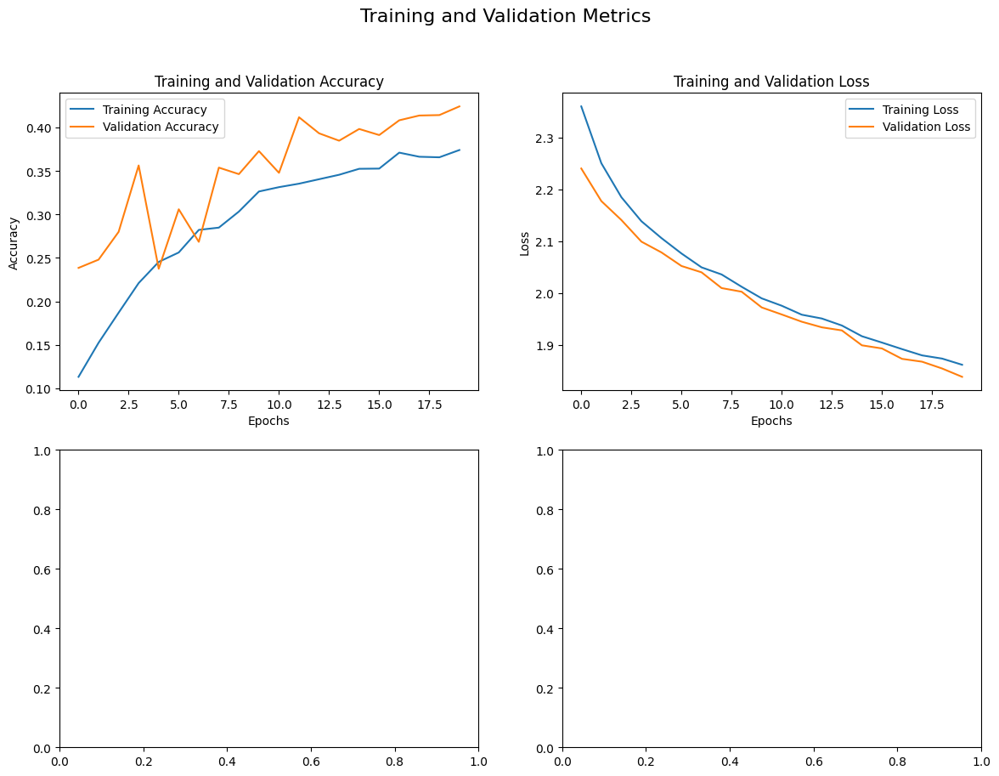

In [86]:
resnet50_model.compile(
    loss="categorical_crossentropy",
    optimizer=optimizer,
    metrics=["accuracy", "Precision", "Recall"]
)

plot_training_history(resnet50_history, metrics)


In [88]:
vgg16_base_model=VGG16(include_top=False,weights='imagenet',input_shape=(224,224,3))

In [89]:
vgg16_base_model.trainable = False

In [90]:
#Transfer Learning Model
inputs=tf.keras.Input(shape=(224,224,3))
x=vgg16_base_model(inputs)
x=tf.keras.layers.GlobalAveragePooling2D()(x)
x= tf.keras.layers.BatchNormalization()(x)
x= tf.keras.layers.Dropout(0.2)(x)
outputs=tf.keras.layers.Dense(38, activation="softmax")(x)
vgg16_model = tf.keras.Model(inputs=inputs, outputs=outputs)
vgg16_model.summary()

Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_20 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ vgg16 (Functional)                   │ (None, 7, 7, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_9           │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 38)                  │          19,494 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,736,230 (56.21 MB)

 Trainable params: 20,518 (80.15 KB)

 Non-trainable params: 14,715,712 (56.14 MB)

In [91]:
vgg16_model.compile(loss="categorical_crossentropy", optimizer= 'adam', metrics=["accuracy",'precision','recall'])

In [92]:
early_stopping_vgg=EarlyStopping(monitor='val_loss',patience=8,verbose=2, restore_best_weights=True)
checkpoints_vgg=ModelCheckpoint('vgg16.keras', monitor='val_loss', save_best_only=True,verbose=2)
reduceonplateau_vgg=ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=0.000001)
callback_vgg=[early_stopping_vgg,reduceonplateau_vgg,checkpoints_vgg]

In [94]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Load VGG16 base model
vgg16_base_model = VGG16(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
vgg16_base_model.trainable = False

# Define model structure
inputs = tf.keras.Input(shape=(224, 224, 3))
x = vgg16_base_model(inputs)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = tf.keras.layers.Dense(10, activation="softmax")(x)  # Adjusted to 3 classes
vgg16_model = tf.keras.Model(inputs=inputs, outputs=outputs)

# Model summary
vgg16_model.summary()

# Compile the model
vgg16_model.compile(
    loss="categorical_crossentropy", 
    optimizer='adam', 
    metrics=["accuracy", tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
)

# Callbacks
early_stopping_vgg = EarlyStopping(monitor='val_loss', patience=8, verbose=2, restore_best_weights=True)
checkpoints_vgg = ModelCheckpoint('vgg16.keras', monitor='val_loss', save_best_only=True, verbose=2)
reduce_on_plateau_vgg = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=0.000001)
callback_vgg = [early_stopping_vgg, reduce_on_plateau_vgg, checkpoints_vgg]

# Train the model
vgg16_history = vgg16_model.fit(
    train,
    epochs=35,
    validation_data=validation,
    callbacks=callback_vgg
)


Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_24 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ vgg16 (Functional)                   │ (None, 7, 7, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_11          │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 10)                  │           5,130 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,721,866 (56.16 MB)

 Trainable params: 6,154 (24.04 KB)

 Non-trainable params: 14,715,712 (56.14 MB)

Epoch 1/35
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step - accuracy: 0.3033 - loss: 2.0505 - precision_4: 0.5028 - recall_4: 0.1004
Epoch 1: val_loss improved from inf to 2.21701, saving model to vgg16.keras
63/63 ━━━━━━━━━━━━━━━━━━━━ 34s 460ms/step - accuracy: 0.3058 - loss: 2.0435 - precision_4: 0.5065 - recall_4: 0.1022 - val_accuracy: 0.1770 - val_loss: 2.2170 - val_precision_4: 0.0000e+00 - val_recall_4: 0.0000e+00 - learning_rate: 0.0010
Epoch 2/35
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step - accuracy: 0.6873 - loss: 0.9851 - precision_4: 0.8413 - recall_4: 0.5036
Epoch 2: val_loss improved from 2.21701 to 1.99598, saving model to vgg16.keras
63/63 ━━━━━━━━━━━━━━━━━━━━ 29s 424ms/step - accuracy: 0.6876 - loss: 0.9842 - precision_4: 0.8414 - recall_4: 0.5041 - val_accuracy: 0.1820 - val_loss: 1.9960 - val_precision_4: 0.7500 - val_recall_4: 0.0015 - learning_rate: 0.0010
Epoch 3/35
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step - accuracy: 0.7554 - loss: 0.7801 - precision_4: 0.8662 - recall_4

In [95]:
Final_Report.append(evaluate_model(vgg16_model,train,test))

63/63 ━━━━━━━━━━━━━━━━━━━━ 21s 337ms/step - accuracy: 0.9365 - loss: 0.2150 - precision_4: 0.9559 - recall_4: 0.9174
Loss   0.21496810019016266
Accuracy   0.9369999766349792
precision   0.9555062651634216
Recall   0.9153749942779541
2/2 ━━━━━━━━━━━━━━━━━━━━ 16s 16s/step - accuracy: 0.8305 - loss: 0.6132 - precision_4: 0.8725 - recall_4: 0.8246
Loss   0.6377124190330505
Accuracy   0.8199999928474426
precision   0.8624338507652283
Recall   0.8149999976158142


Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_28 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ vgg16 (Functional)                   │ (None, 7, 7, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_13          │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_13 (Dropout)                 │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (None, 10)                  │           5,130 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,721,866 (56.16 MB)

 Trainable params: 6,154 (24.04 KB)

 Non-trainable params: 14,715,712 (56.14 MB)

Epoch 1/35
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step - accuracy: 0.2752 - loss: 2.1747 - precision: 0.4166 - recall: 0.0781
Epoch 1: val_loss improved from inf to 2.06374, saving model to vgg16.keras
63/63 ━━━━━━━━━━━━━━━━━━━━ 34s 456ms/step - accuracy: 0.2776 - loss: 2.1673 - precision: 0.4212 - recall: 0.0798 - val_accuracy: 0.2210 - val_loss: 2.0637 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 0.0010
Epoch 2/35
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step - accuracy: 0.6756 - loss: 1.0117 - precision: 0.8465 - recall: 0.4776
Epoch 2: val_loss improved from 2.06374 to 1.84871, saving model to vgg16.keras
63/63 ━━━━━━━━━━━━━━━━━━━━ 28s 402ms/step - accuracy: 0.6759 - loss: 1.0108 - precision: 0.8466 - recall: 0.4782 - val_accuracy: 0.4455 - val_loss: 1.8487 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 0.0010
Epoch 3/35
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step - accuracy: 0.7571 - loss: 0.7892 - precision: 0.8658 - recall: 0.6139
Epoch 3: va

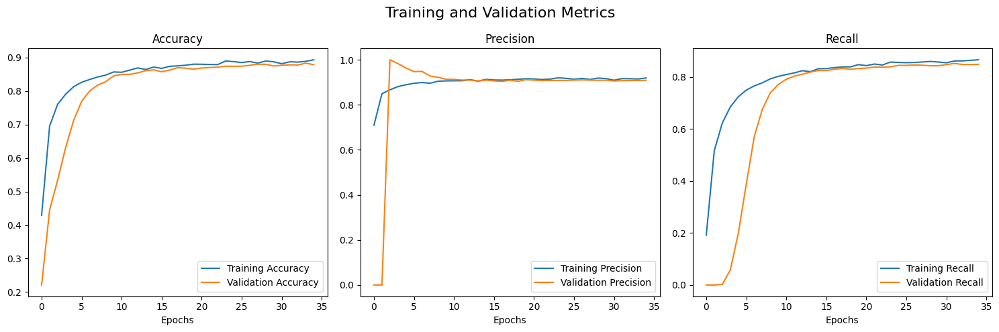

In [97]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import matplotlib.pyplot as plt

# Load VGG16 base model
vgg16_base_model = VGG16(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
vgg16_base_model.trainable = False

# Define model structure
inputs = tf.keras.Input(shape=(224, 224, 3))
x = vgg16_base_model(inputs)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = tf.keras.layers.Dense(10, activation="softmax")(x)  # Adjusted for 3 classes
vgg16_model = tf.keras.Model(inputs=inputs, outputs=outputs)

# Model summary
vgg16_model.summary()

# Compile the model with TensorFlow metric objects
vgg16_model.compile(
    loss="categorical_crossentropy", 
    optimizer='adam', 
    metrics=["accuracy", tf.keras.metrics.Precision(name='precision'), tf.keras.metrics.Recall(name='recall')]
)

# Define callbacks
early_stopping_vgg = EarlyStopping(monitor='val_loss', patience=8, verbose=2, restore_best_weights=True)
checkpoints_vgg = ModelCheckpoint('vgg16.keras', monitor='val_loss', save_best_only=True, verbose=2)
reduce_on_plateau_vgg = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=0.000001)
callback_vgg = [early_stopping_vgg, reduce_on_plateau_vgg, checkpoints_vgg]

# Train the model
vgg16_history = vgg16_model.fit(
    train,
    epochs=35,
    validation_data=validation,
    callbacks=callback_vgg,
    batch_size=64  # Specify batch size if necessary
)

# Function to plot training history
def plot_training_history(history, metrics, title="Training and Validation Metrics"):
    fig, axs = plt.subplots(1, len(metrics), figsize=(15, 5))
    fig.suptitle(title, fontsize=16)

    for ax, metric in zip(axs.flat, metrics):
        if metric in history.history:  # Check if metric exists in history
            ax.plot(history.history[metric], label=f'Training {metric.capitalize()}')
            ax.plot(history.history[f'val_{metric}'], label=f'Validation {metric.capitalize()}')
            ax.set_xlabel('Epochs')
            ax.set_title(metric.capitalize())
            ax.legend()
        else:
            print(f"Metric '{metric}' not found in history.")
    plt.tight_layout()
    plt.show()

# Define the metrics to plot
metrics_to_plot = ['accuracy', 'precision', 'recall']

# Plot training history
plot_training_history(vgg16_history, metrics_to_plot)


In [98]:
Final_Report

[(0.79, 0.84, 0.65, 0.53, 0.77, 0.64, 0.31, 0.26),
 (0.06, 0.11, 0.99, 0.97, 0.99, 0.97, 0.99, 0.97),
 (0.01, 0.01, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0),
 (1.82, 1.86, 0.44, 0.4, 0.79, 0.5, 0.0, 0.0),
 (0.21, 0.64, 0.94, 0.82, 0.96, 0.86, 0.92, 0.81)]

In [99]:
models_name=['ResNet50','VGG16']
Model_accuracy=pd.DataFrame(Final_Report,index=models_name,columns=['Train Loss','Test Loss','Train Accuracy','Test Accuracy','Train precision','Test precision','Train Recall','Test Recall'])


ValueError: Length of values (5) does not match length of index (2)

In [101]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16, ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Input, Dense, Flatten, Concatenate, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Image input size
IMG_SIZE = (224, 224, 3)

# Define a single shared input layer
input_layer = Input(shape=IMG_SIZE, name="shared_input")

# Load pre-trained models with shared input
vgg16_base = VGG16(weights="imagenet", include_top=False, input_tensor=input_layer)
resnet50_base = ResNet50(weights="imagenet", include_top=False, input_tensor=input_layer)

# Freeze pre-trained layers
for model in [vgg16_base, resnet50_base]:
    for layer in model.layers:
        layer.trainable = False  # Freeze pre-trained weights

# Extract feature maps using Global Average Pooling (reduces parameters)
vgg16_features = GlobalAveragePooling2D(name="vgg16_pool")(vgg16_base.output)
resnet50_features = GlobalAveragePooling2D(name="resnet50_pool")(resnet50_base.output)

# Merge feature vectors
merged = Concatenate(name="merged_features")([vgg16_features, resnet50_features])

# Fully connected layers
fc = Dense(512, activation="relu", name="fc1")(merged)
fc = Dropout(0.5, name="dropout1")(fc)
fc = Dense(256, activation="relu", name="fc2")(fc)
fc = Dropout(0.5, name="dropout2")(fc)
output = Dense(10, activation="softmax", name="output_layer")(fc)  # Adjust for 3 classes

# Define the merged model
merged_model = Model(inputs=input_layer, outputs=output)

# Compile the model
merged_model.compile(optimizer=Adam(learning_rate=0.0001), loss="categorical_crossentropy", metrics=["accuracy"])

# Summary
merged_model.summary()

# ---------------------- DATA LOADING ---------------------- #
train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=30, horizontal_flip=True, validation_split=0.2)

# Load dataset from directory (modify path accordingly)
train_generator = train_datagen.flow_from_directory(
    "/kaggle/input/tomatoleaf/tomato/train",  # Change to your dataset path
    target_size=(224, 224),
    batch_size=32,
    class_mode="categorical",
    subset="training"
)

val_generator = train_datagen.flow_from_directory(
    "/kaggle/input/tomatoleaf/tomato/val",
    target_size=(224, 224),
    batch_size=32,
    class_mode="categorical",
    subset="validation"
)

# ---------------------- TRAIN MODEL FOR 30 EPOCHS ---------------------- #
history = merged_model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=35
)


Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ shared_input (InputLayer) │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ shared_input[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 39,747,530 (151.62 MB)

 Trainable params: 1,445,130 (5.51 MB)

 Non-trainable params: 38,302,400 (146.11 MB)

Found 8000 images belonging to 10 classes.
Found 200 images belonging to 10 classes.
Epoch 1/35
250/250 ━━━━━━━━━━━━━━━━━━━━ 102s 359ms/step - accuracy: 0.1091 - loss: 2.4636 - val_accuracy: 0.2100 - val_loss: 2.2372
Epoch 2/35
250/250 ━━━━━━━━━━━━━━━━━━━━ 86s 332ms/step - accuracy: 0.1700 - loss: 2.2354 - val_accuracy: 0.3500 - val_loss: 2.0837
Epoch 3/35
250/250 ━━━━━━━━━━━━━━━━━━━━ 85s 329ms/step - accuracy: 0.2747 - loss: 2.0968 - val_accuracy: 0.4550 - val_loss: 1.8497
Epoch 4/35
250/250 ━━━━━━━━━━━━━━━━━━━━ 86s 334ms/step - accuracy: 0.3482 - loss: 1.9022 - val_accuracy: 0.5450 - val_loss: 1.6114
Epoch 5/35
250/250 ━━━━━━━━━━━━━━━━━━━━ 85s 330ms/step - accuracy: 0.4151 - loss: 1.7205 - val_accuracy: 0.6050 - val_loss: 1.4354
Epoch 6/35
250/250 ━━━━━━━━━━━━━━━━━━━━ 86s 334ms/step - accuracy: 0.4627 - loss: 1.5623 - val_accuracy: 0.6050 - val_loss: 1.2902
Epoch 7/35
250/250 ━━━━━━━━━━━━━━━━━━━━ 86s 332ms/step - accuracy: 0.5095 - loss: 1.4254 - val_accuracy: 0.6700 - val_loss: 1.14

In [102]:
test_datagen = ImageDataGenerator(rescale=1.0/255)

test_generator = test_datagen.flow_from_directory(
    "/kaggle/working/test",  # Update with your test data path
    target_size=(224, 224),
    batch_size=32,
    class_mode="categorical",
    shuffle=False
)

# Evaluate model on test data
test_loss, test_accuracy = merged_model.evaluate(test_generator)

print(f"✅ Test Accuracy: {test_accuracy * 100:.2f}%")

Found 200 images belonging to 10 classes.
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - accuracy: 0.7462 - loss: 0.6841 
✅ Test Accuracy: 77.50%


In [112]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam


densenet_base_model = DenseNet121(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
densenet_base_model.trainable = False  

# Build model architecture
inputs = layers.Input(shape=(224, 224, 3))
x = densenet_base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.5)(x)  
outputs = layers.Dense(38, activation='softmax')(x)  


densenet_model = models.Model(inputs, outputs)

# Compile the model
densenet_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)

# Summary to check layer details
densenet_model.summary()


Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_38 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ densenet121 (Functional)             │ (None, 7, 7, 1024)          │       7,037,504 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_18          │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_18 (Dropout)                 │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_18 (Dense)                     │ (None, 38)                  │          38,950 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,076,454 (26.99 MB)

 Trainable params: 38,950 (152.15 KB)

 Non-trainable params: 7,037,504 (26.85 MB)

In [114]:
# Unfreeze last layers for fine-tuning
densenet_base_model.trainable = True
for layer in densenet_base_model.layers[:-20]:  
    layer.trainable = False

# Recompile before fine-tuning
densenet_model.compile(
    optimizer=Adam(learning_rate=0.001),  
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)


Found 10000 images belonging to 10 classes.
Found 1000 images belonging to 10 classes.


Model: "functional_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_40 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ densenet121 (Functional)             │ (None, 7, 7, 1024)          │       7,037,504 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_19          │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_12               │ (None, 1024)                │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_19 (Dropout)                 │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 10)                  │          10,250 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,051,850 (26.90 MB)

 Trainable params: 12,298 (48.04 KB)

 Non-trainable params: 7,039,552 (26.85 MB)

Epoch 1/35
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 717ms/step - accuracy: 0.4483 - loss: 1.6664 - precision: 0.6660 - recall: 0.2748
Epoch 1: val_loss improved from inf to 0.86863, saving model to densenet121.keras
157/157 ━━━━━━━━━━━━━━━━━━━━ 149s 809ms/step - accuracy: 0.4494 - loss: 1.6629 - precision: 0.6670 - recall: 0.2760 - val_accuracy: 0.7260 - val_loss: 0.8686 - val_precision: 0.8588 - val_recall: 0.5170 - learning_rate: 0.0010
Epoch 2/35
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 689ms/step - accuracy: 0.8126 - loss: 0.5884 - precision: 0.8882 - recall: 0.7283
Epoch 2: val_loss improved from 0.86863 to 0.54835, saving model to densenet121.keras
157/157 ━━━━━━━━━━━━━━━━━━━━ 118s 720ms/step - accuracy: 0.8127 - loss: 0.5881 - precision: 0.8882 - recall: 0.7285 - val_accuracy: 0.8320 - val_loss: 0.5483 - val_precision: 0.8909 - val_recall: 0.7430 - learning_rate: 0.0010
Epoch 3/35
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 681ms/step - accuracy: 0.8501 - loss: 0.4568 - precision: 0.9008 - recall: 0.7956
Epo

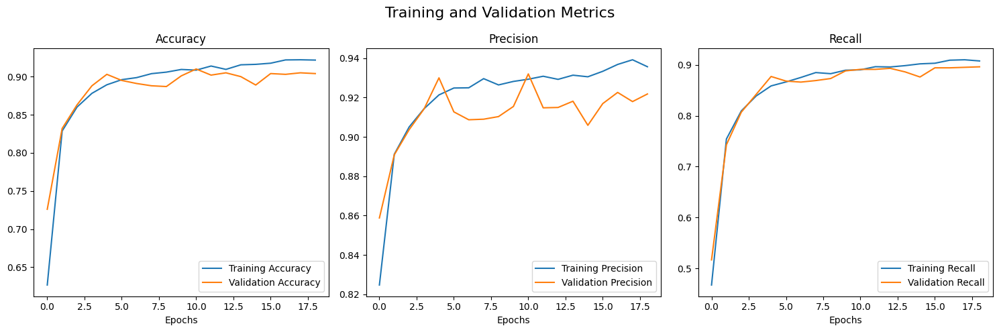

In [115]:


import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import matplotlib.pyplot as plt

# Define dataset directories (update these paths based on your dataset location)
train_dir = '/kaggle/input/tomatoleaf/tomato/train'  # Update with your train dataset path
validation_dir = '/kaggle/input/tomatoleaf/tomato/val'  # Update with your validation dataset path

# Load datasets using ImageDataGenerator
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

validation_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

train = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical'
)

validation = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical'
)

# Load DenseNet121 base model
densenet_base_model = DenseNet121(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
densenet_base_model.trainable = False

# Define model structure
inputs = tf.keras.Input(shape=(224, 224, 3))
x = densenet_base_model(inputs)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = tf.keras.layers.Dense(10, activation="softmax")(x)  # Adjusted for 3 classes
densenet_model = tf.keras.Model(inputs=inputs, outputs=outputs)

# Model summary
densenet_model.summary()

# Compile the model with TensorFlow metric objects
densenet_model.compile(
    loss="categorical_crossentropy", 
    optimizer='adam', 
    metrics=["accuracy", tf.keras.metrics.Precision(name='precision'), tf.keras.metrics.Recall(name='recall')]
)

# Define callbacks
early_stopping_densenet = EarlyStopping(monitor='val_loss', patience=8, verbose=2, restore_best_weights=True)
checkpoints_densenet = ModelCheckpoint('densenet121.keras', monitor='val_loss', save_best_only=True, verbose=2)
reduce_on_plateau_densenet = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=0.000001)
callback_densenet = [early_stopping_densenet, reduce_on_plateau_densenet, checkpoints_densenet]

# Train the model
densenet_history = densenet_model.fit(
    train,
    epochs=35,
    validation_data=validation,
    callbacks=callback_densenet
)

# Function to plot training history
def plot_training_history(history, metrics, title="Training and Validation Metrics"):
    fig, axs = plt.subplots(1, len(metrics), figsize=(15, 5))
    fig.suptitle(title, fontsize=16)

    for ax, metric in zip(axs.flat, metrics):
        if metric in history.history:  # Check if metric exists in history
            ax.plot(history.history[metric], label=f'Training {metric.capitalize()}')
            ax.plot(history.history[f'val_{metric}'], label=f'Validation {metric.capitalize()}')
            ax.set_xlabel('Epochs')
            ax.set_title(metric.capitalize())
            ax.legend()
        else:
            print(f"Metric '{metric}' not found in history.")
    plt.tight_layout()
    plt.show()

# Define the metrics to plot
metrics_to_plot = ['accuracy', 'precision', 'recall']

# Plot training history
plot_training_history(densenet_history, metrics_to_plot)


In [116]:
test_path = '/kaggle/working/test'
test=test_datagen.flow_from_directory(test_path,
                                      target_size=(224,224)
                                      ,color_mode='rgb'
                                      ,class_mode='categorical',
                                      batch_size=128)
Final_Report.append(evaluate_model(densenet_model,train,test))

Found 200 images belonging to 10 classes.
157/157 ━━━━━━━━━━━━━━━━━━━━ 116s 736ms/step - accuracy: 0.9420 - loss: 0.1870 - precision: 0.9556 - recall: 0.9274
Loss   0.17646898329257965
Accuracy   0.9448000192642212
precision   0.9591437578201294
Recall   0.9319999814033508
2/2 ━━━━━━━━━━━━━━━━━━━━ 16s 11s/step - accuracy: 0.9054 - loss: 0.2248 - precision: 0.9449 - recall: 0.8961
Loss   0.229018434882164
Accuracy   0.9049999713897705
precision   0.942105233669281
Recall   0.8949999809265137


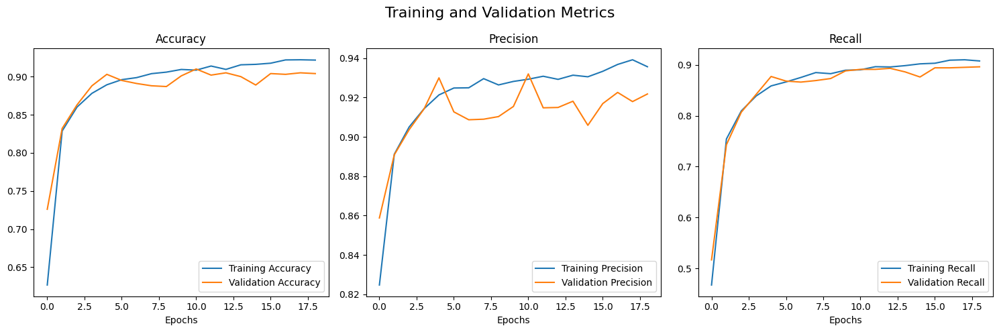

In [117]:
# Define the metrics to plot
metrics_to_plot = ['accuracy', 'precision', 'recall']

# Call the plot_training_history function with the correct variables
plot_training_history(densenet_history, metrics_to_plot)

In [118]:
Final_Report

[(0.79, 0.84, 0.65, 0.53, 0.77, 0.64, 0.31, 0.26),
 (0.06, 0.11, 0.99, 0.97, 0.99, 0.97, 0.99, 0.97),
 (0.01, 0.01, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0),
 (1.82, 1.86, 0.44, 0.4, 0.79, 0.5, 0.0, 0.0),
 (0.21, 0.64, 0.94, 0.82, 0.96, 0.86, 0.92, 0.81),
 (0.01, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0),
 (0.18, 0.23, 0.94, 0.9, 0.96, 0.94, 0.93, 0.89)]

In [119]:
models_name.append('DenseNet121')
Model_accuracy=pd.DataFrame(Final_Report,index=models_name,columns=['Train Loss','Test Loss','Train Accuracy','Test Accuracy','Train precision','Test precision','Train Recall','Test Recall'])


ValueError: Length of values (7) does not match length of index (4)

In [121]:
Model_accuracy.to_csv('Report.csv',index=False)